In [1]:
#Import Libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import Lasso, LassoCV
from sklearn.linear_model import ElasticNet, ElasticNetCV
from sklearn.naive_bayes import MultinomialNB, BernoulliNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.pipeline import Pipeline

from sklearn.metrics import accuracy_score, classification_report, plot_confusion_matrix, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

sns.set_context(context='talk')
sns.set_style('white')
%config InlineBackend.figure_format = 'retina'

%matplotlib inline

## Trap information

In [6]:
#!gdown --id 19cou1y5flR2TKObjEK0Cx7qrDjonA4a1 
#!gdown --id 1kE1yWsEJpT-Y07fNm14DpiwLwRzTusuD 
#!gdown --id 189-e-6zSbm5Sz3ptTNFFfAODbbRLhY9I 
#!gdown --id 1VfKf3ajelimSfJzRZRcjUQsyqUoZ4C8C

In [7]:
df_trap = pd.read_csv('data/train.csv')
df_trap.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0


In [8]:
#Convert date into datetime object for further comparison and filtering
df_trap['Date'] = pd.to_datetime(df_trap['Date'])
df_trap.dtypes

Date                      datetime64[ns]
Address                           object
Species                           object
Block                              int64
Street                            object
Trap                              object
AddressNumberAndStreet            object
Latitude                         float64
Longitude                        float64
AddressAccuracy                    int64
NumMosquitos                       int64
WnvPresent                         int64
dtype: object

In [9]:
#Drop Address, Block, Street, AddressNumberAndStreet, sine we've already got the geographical coordinates
df_trap = df_trap.drop(columns=['Address','Block','Street','AddressNumberAndStreet'])

### Deciding which weather station will be used for each trap

Weather information at the nearest station will be used for each observation, therefore, we need to calculate the distance from each weather station with following information

- Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
- Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level

For distance calculation, we'll use the empirical estimation of 1° = 111 km  (or 60 nautical miles)

In [10]:
# Distance calculation 1° = 111 km  (or 60 nautical miles)
lat_s1 = 41.995
long_s1 = -87.933
lat_s2 = 41.786
long_s2 = -87.752

df_trap['Distance_from_s1_km'] = np.sqrt(np.power(60*(df_trap['Latitude']- lat_s1),2)+
                                         np.power(60*(df_trap['Longitude']- long_s1),2))* 111/60 #*111/60 to convert from NM to km

df_trap['Distance_from_s2_km'] = np.sqrt(np.power(60*(df_trap['Latitude']- lat_s2),2)+
                                         np.power(60*(df_trap['Longitude']- long_s2),2))* 111/60 #*111/60 to convert from NM to km

#Select dominant weather station
df_trap['Station'] =df_trap.apply(lambda row: 2 if (row['Distance_from_s1_km'] > row['Distance_from_s2_km']) else 1 , axis = 1)

In [11]:
df_trap.head()

,Date,Species,Trap,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Distance_from_s1_km,Distance_from_s2_km,Station
0,2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.954690,-87.800991,9,1,0,15.320924,19.498260,1
1,2007-05-29,CULEX RESTUANS,T002,41.954690,-87.800991,9,1,0,15.320924,19.498260,1
2,2007-05-29,CULEX RESTUANS,T007,41.994991,-87.769279,9,1,0,18.173031,23.277153,1
3,2007-05-29,CULEX PIPIENS/RESTUANS,T015,41.974089,-87.824812,8,1,0,12.231129,22.387646,1
4,2007-05-29,CULEX RESTUANS,T015,41.974089,-87.824812,8,4,0,12.231129,22.387646,1


## Weather information

- Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level
- Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level

In [13]:
df_weather = pd.read_csv('data/weather.csv')
df_weather['Date'] = pd.to_datetime(df_weather['Date'])
df_weather.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


### Merged Trap and Weather data into single dataframe

In [14]:
#Merging related weather information to the trap dataframe
df_merged = pd.merge(df_trap,df_weather,left_on=['Date','Station'],right_on=['Date','Station'])
df_merged.head()

,Date,Species,Trap,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Distance_from_s1_km,Distance_from_s2_km,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,2007-05-29,CULEX PIPIENS/RESTUANS,T002,41.954690,-87.800991,9,1,0,15.320924,19.498260,...,BR HZ,0,M,0.0,0.00,29.39,30.11,5.8,18,6.5
1,2007-05-29,CULEX RESTUANS,T002,41.954690,-87.800991,9,1,0,15.320924,19.498260,...,BR HZ,0,M,0.0,0.00,29.39,30.11,5.8,18,6.5
2,2007-05-29,CULEX RESTUANS,T007,41.994991,-87.769279,9,1,0,18.173031,23.277153,...,BR HZ,0,M,0.0,0.00,29.39,30.11,5.8,18,6.5
3,2007-05-29,CULEX PIPIENS/RESTUANS,T015,41.974089,-87.824812,8,1,0,12.231129,22.387646,...,BR HZ,0,M,0.0,0.00,29.39,30.11,5.8,18,6.5
4,2007-05-29,CULEX RESTUANS,T015,41.974089,-87.824812,8,4,0,12.231129,22.387646,...,BR HZ,0,M,0.0,0.00,29.39,30.11,5.8,18,6.5


In [15]:
df_merged.shape

(10506, 31)

## Spray data

In [17]:
#Spray data: Location where Corolado authority attempt to spray pesticide to control Wnv
df_spray = pd.read_csv('data/spray.csv')
df_spray['Date'] = pd.to_datetime(df_spray['Date'])
df_spray.head()

,Date,Time,Latitude,Longitude
0,2011-08-29,6:56:58 PM,42.391623,-88.089163
1,2011-08-29,6:57:08 PM,42.391348,-88.089163
2,2011-08-29,6:57:18 PM,42.391022,-88.089157
3,2011-08-29,6:57:28 PM,42.390637,-88.089158
4,2011-08-29,6:57:38 PM,42.390410,-88.088858


### 2011 Spray

In [20]:
import folium

m = folium.Map(location=[lat_s1, long_s1])

for row in df_spray[(df_spray['Date'].dt.year == 2011) & (df_spray['Date'].dt.month == 8)].iterrows():
    folium.Circle(
    radius = 20,
    location = [row[1][2],row[1][3]],
    color='crimson',
    fill = False).add_to(m)
    
#Trap 
for row in df_merged.groupby('Trap').mean().iterrows():
    folium.Marker(
    [row[1][0], row[1][1]], popup=row[0]
    ).add_to(m)

In [21]:
m = folium.Map(location=[lat_s1, long_s1])

#Spray area
for row in df_spray[(df_spray['Date'].dt.year == 2011) & (df_spray['Date'].dt.month == 9)].iterrows():
    folium.Circle(
    radius = 20,
    location = [row[1][2],row[1][3]],
    color='crimson',
    fill = False).add_to(m)


#Trap 
for row in df_merged.groupby('Trap').mean().iterrows():
    folium.Marker(
    [row[1][0], row[1][1]], popup=row[0]
    ).add_to(m)

m

Trapped affected by spraying pesticide on September 2011:
- T006
- T014
- T015
- T223

Hence, I'll drop the aforementioned traps information in 2011 from our training data


<AxesSubplot:xlabel='Date', ylabel='NumMosquitos'>

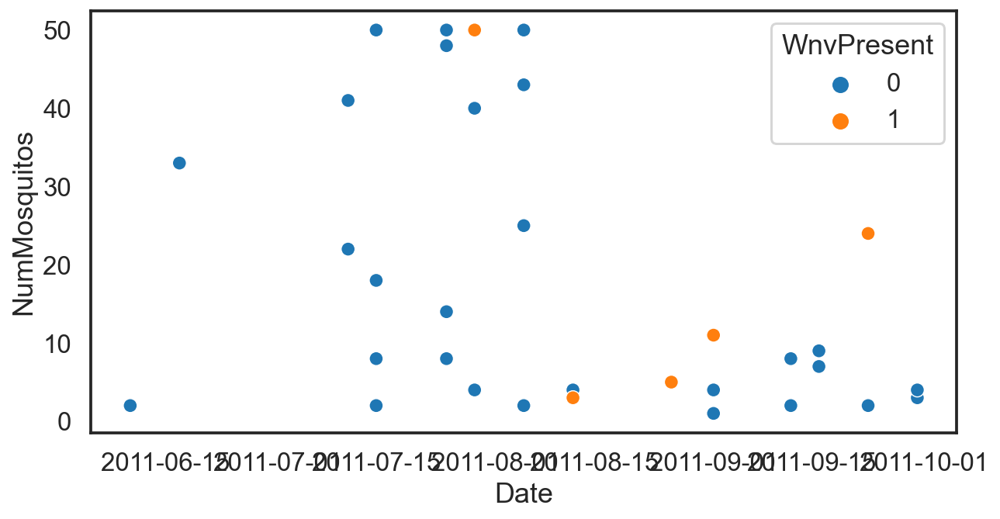

In [22]:
plt.figure(figsize=(10,5))
sns.scatterplot(data = df_merged[(df_merged['Trap'].str.contains('T223')) & (df_merged['Date'].dt.year == 2011)]
                , x = 'Date', y = 'NumMosquitos',hue = 'WnvPresent')

### 2013 Spray

In [23]:
m = folium.Map(location=[lat_s1, long_s1])

#Spray area
for row in df_spray[(df_spray['Date'].dt.year == 2013)].iterrows():
    folium.Circle(
    radius = 20,
    location = [row[1][2],row[1][3]],
    color='crimson',
    fill = False).add_to(m)


#Trap 
for row in df_merged.groupby('Trap').mean().iterrows():
    folium.Marker(
    [row[1][0], row[1][1]], popup=row[0]
    ).add_to(m)

m

Trapped affected by spraying pesticide on 2013:
- T016
- T223
- T143
- T008
- T028
- T231
- T001
- T218
- T228 
- T147
- T050
- T017
- T142
- T144
- T013
- T037
- T151
- T153
- T230
- T044
- T066
- T156
- T159
- T089
- T085
- T080
- T162
- T227

Hence, I'll drop the aforementioned traps information in 2013 from our training data

## Data cleaning (Drop the traps affected by pesticide)

Trapped affected by spraying pesticide on September 2011:
T006
T014
T015
T223

In [24]:
#Drop affected trap in 2011
df_merged = df_merged[~((df_merged['Date'].dt.year == 2011) & 
                        (df_merged['Trap'].isin(['T006', 'T014', 'T015', 'T223'])))]



In [25]:
#Drop affected trap in 2013
df_merged = df_merged[~((df_merged['Date'].dt.year == 2013) & 
                        (df_merged['Trap'].isin(
                            
"""T016
T223
T143
T008
T028
T231
T001
T218
T228
T147
T050
T017
T142
T144
T013
T037
T151
T153
T230
T044
T066
T156
T159
T089
T085
T080
T162
T227""".split())))]

In [26]:
df_merged['Tavg'] = df_merged['Tavg'].astype(int)
# Convert Precipitation into float
df_merged['PrecipTotal'] = df_merged['PrecipTotal'].map(lambda s: -1 if s.strip().isalpha() else float(s))
# Convert Station Pressure into float
df_merged['StnPressure'] = df_merged['StnPressure'].map(lambda s: -1 if s.strip().isalpha() else float(s))

## EDA

It is believed that hot and dry conditions are more favorable for West Nile virus than cold and wet.

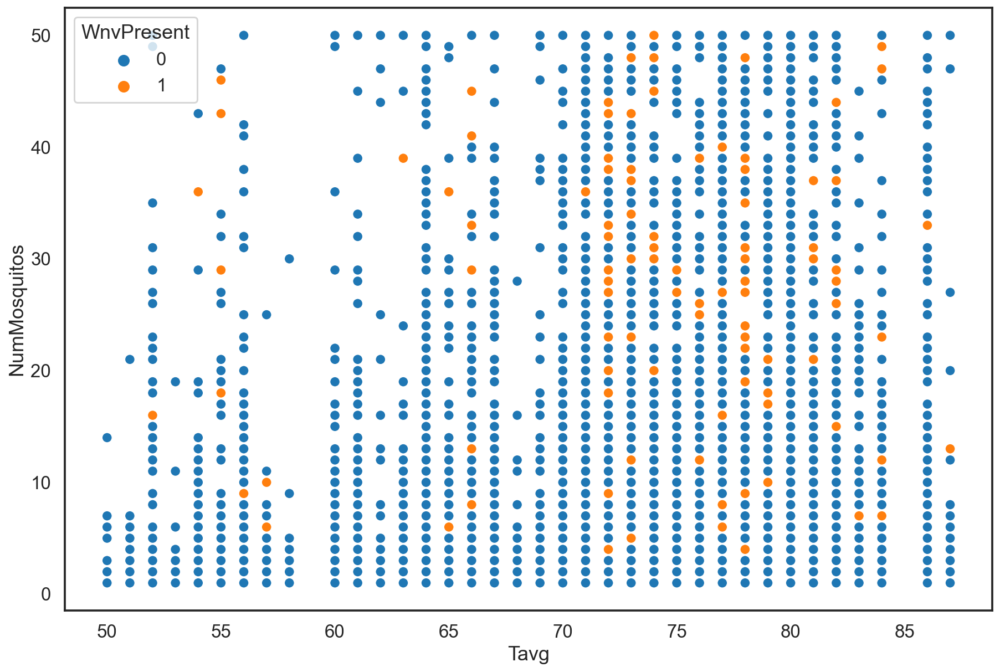

In [27]:
plt.figure(figsize=(15,10))
sns.scatterplot(data=df_merged.sort_values(by='Tavg'), x = 'Tavg', y = 'NumMosquitos',hue = 'WnvPresent');

<AxesSubplot:xlabel='Month', ylabel='WnvPresent'>

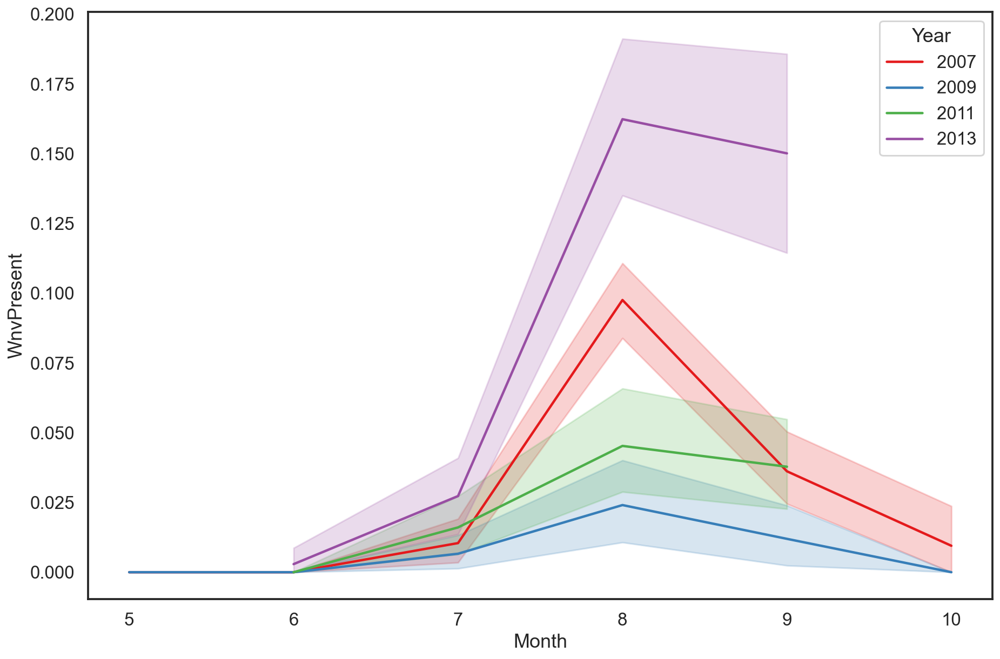

In [28]:
df_merged['Year'] = df_merged['Date'].dt.year
df_merged['Month'] = df_merged['Date'].dt.month
plt.figure(figsize=(15,10))
sns.lineplot(data=df_merged, x = 'Month',y = 'WnvPresent', hue = 'Year',palette='Set1' )

Text(0.5, 1.05, 'Data distribution in terms of %RH and Average Temperature (F)')

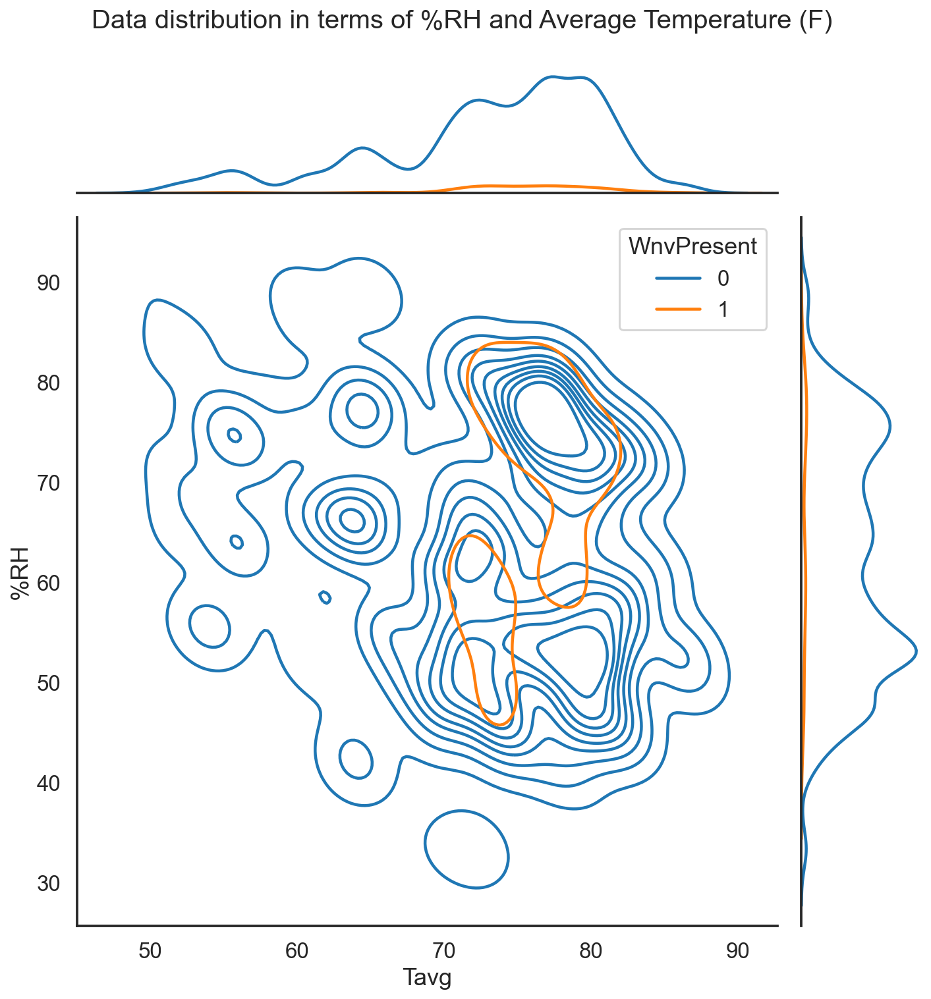

In [29]:
# Calculating Relative Humidity (%RH)
df_merged['%RH'] = 100 - (25/9)*(df_merged['Tavg'] - df_merged['DewPoint'])

g = sns.jointplot(data=df_merged, x="Tavg", y="%RH", hue='WnvPresent', kind = 'kde', height = 10);
g.fig.suptitle('Data distribution in terms of %RH and Average Temperature (F)',y = 1.05, fontsize = 20)

In [30]:
df_merged.groupby('Species').mean()

,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Distance_from_s1_km,Distance_from_s2_km,Station,Tmax,Tmin,Tavg,DewPoint,PrecipTotal,StnPressure,ResultSpeed,ResultDir,Year,Month,%RH
Species,,,,,,,,,,,,,,,,,,,
CULEX ERRATICUS,41.974689,-87.890615,9.000000,7.000000,0.000000,5.217029,25.988620,1.000000,86.000000,57.000000,72.000000,58.000000,0.000000,29.380000,4.700000,20.000000,2013.000000,9.000000,61.111111
CULEX PIPIENS,41.810782,-87.679310,7.402074,16.617127,0.086022,35.669764,17.471177,1.831413,83.173963,65.614823,74.634025,61.217358,0.074121,29.285630,5.399002,17.125576,2008.537634,8.158986,62.731481
CULEX PIPIENS/RESTUANS,41.846700,-87.704345,7.932060,13.634769,0.050400,31.261213,17.073464,1.774201,81.704707,63.914964,73.035746,59.432282,0.042231,29.207094,5.922136,18.048179,2009.516874,7.706261,62.212601
CULEX RESTUANS,41.857122,-87.713084,8.018309,8.250877,0.014414,29.842556,17.009712,1.749903,80.907674,63.088041,72.217374,58.493183,0.023190,29.181091,6.286560,17.489287,2010.153876,7.206467,61.877245
CULEX SALINARIUS,41.825134,-87.693788,7.767442,1.686047,0.000000,33.498139,18.116369,1.779070,81.930233,64.395349,73.325581,59.720930,0.023953,28.937326,6.406977,18.220930,2008.744186,7.488372,62.209302
CULEX TARSALIS,41.818023,-87.661568,7.500000,1.166667,0.000000,36.313875,16.343597,1.833333,64.500000,51.833333,58.500000,45.333333,0.003333,29.561667,3.816667,13.166667,2010.333333,8.833333,63.425926
CULEX TERRITANS,41.796310,-87.656955,7.584475,2.305936,0.000000,38.749234,16.924052,1.949772,84.196347,65.630137,75.123288,61.150685,0.082283,29.165251,5.907763,18.789954,2008.890411,7.890411,61.187215


Text(0.5, 1.0, 'Species of Mosquitos\n')

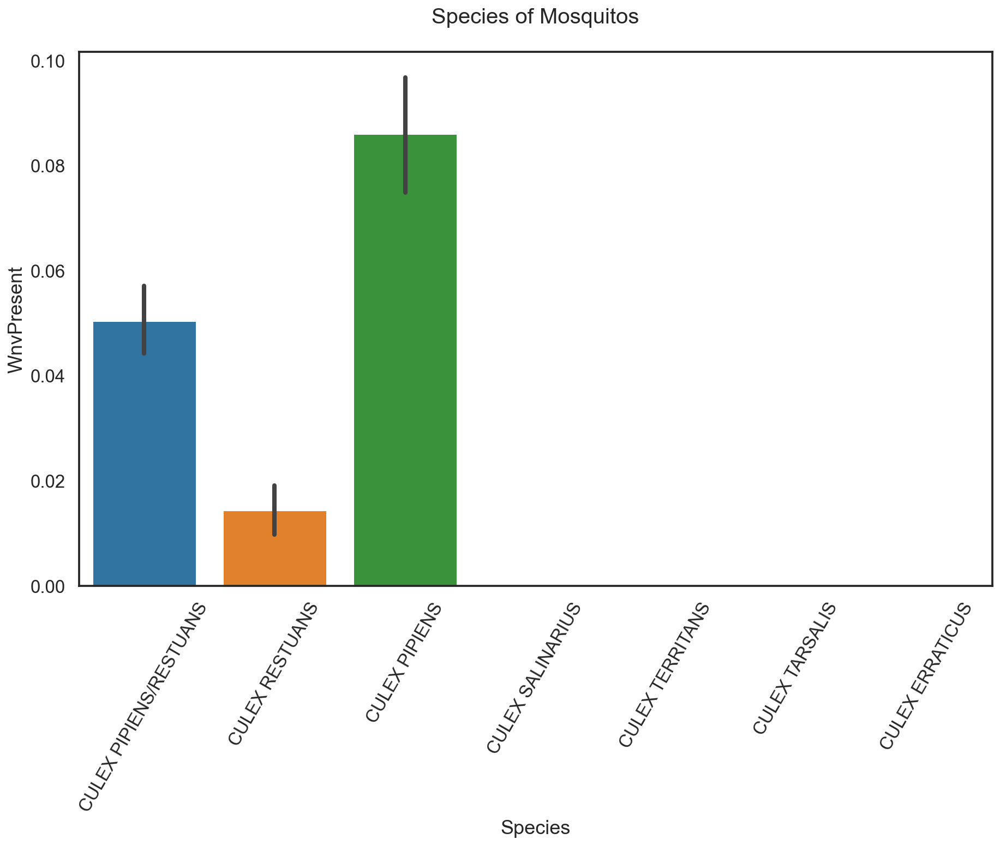

In [31]:
plt.figure(figsize=(15,9))
g = sns.barplot(x='Species',y='WnvPresent',data=df_merged)
g.set_xticklabels(g.get_xticklabels(),rotation = 60);
plt.title('Species of Mosquitos\n', fontsize=20)

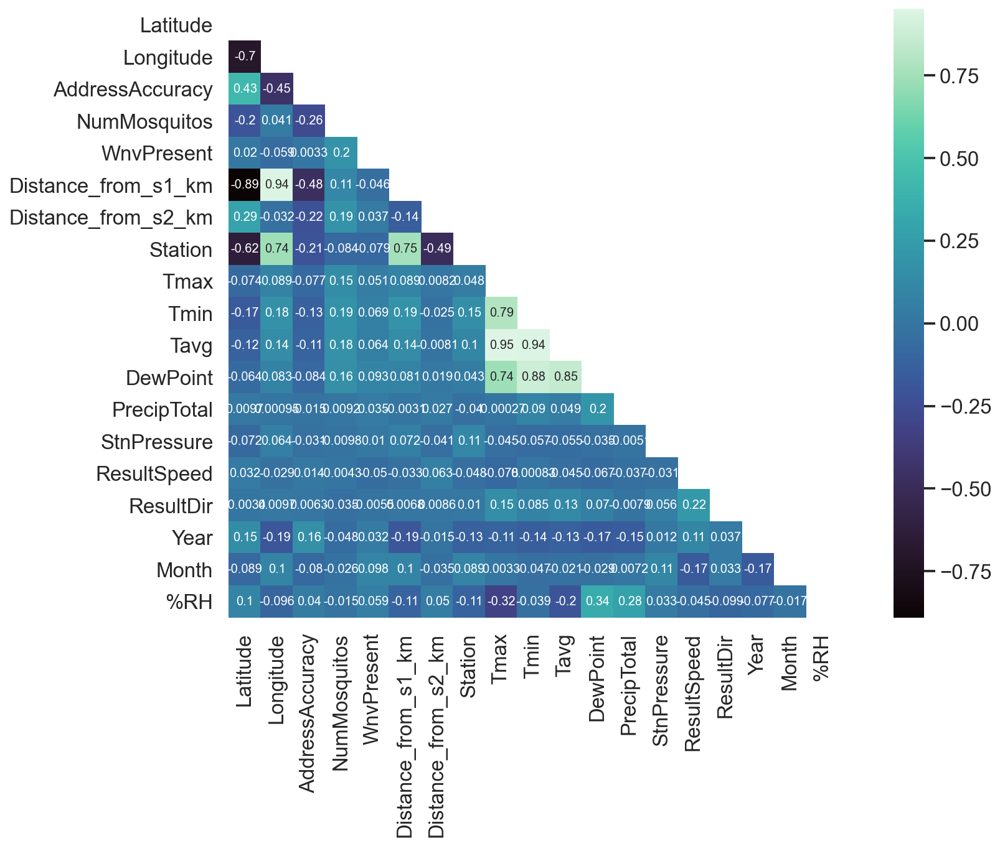

In [32]:
corr = df_merged.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(16, 9))
ax = sns.heatmap(corr, mask=mask, square=True, annot=True, cmap = 'mako')

Text(0.5, 1.0, 'Precipitation distribution')

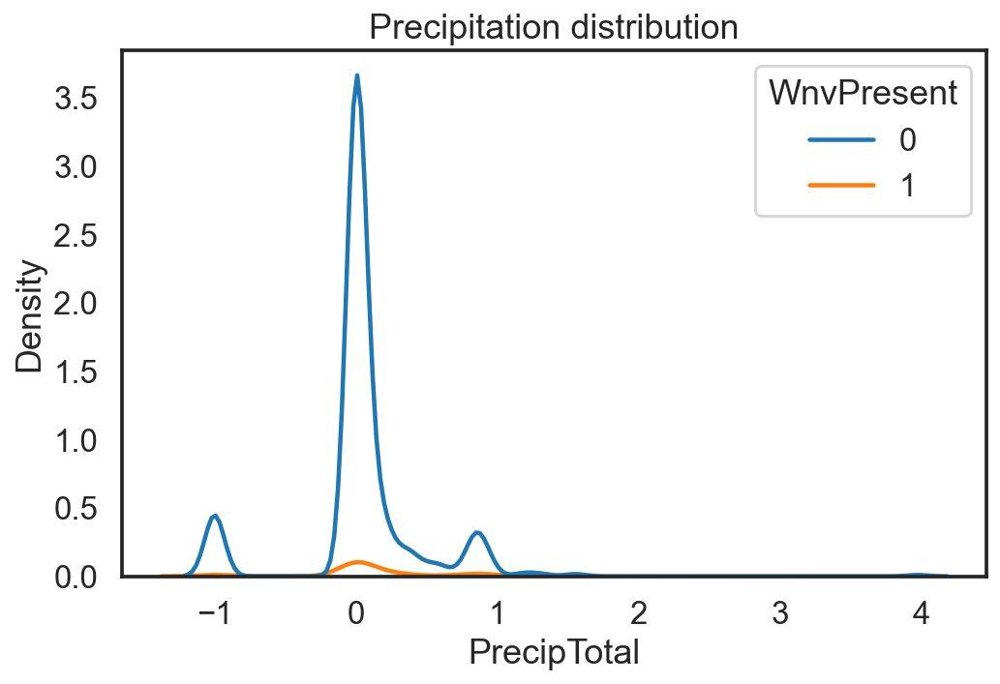

In [33]:
plt.figure(figsize=(8,5))
g = sns.kdeplot(data=df_merged, x='PrecipTotal',hue = 'WnvPresent')
g.set_title('Precipitation distribution')

Text(0.5, 1.0, 'Wind Speed VS Wnv spread')

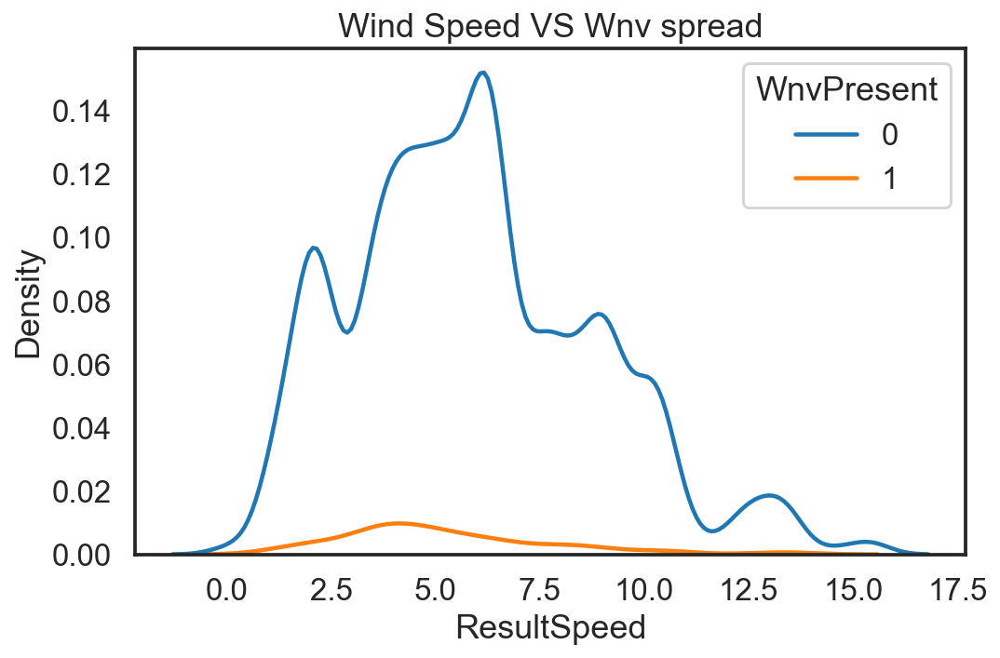

In [34]:
plt.figure(figsize=(8,5))
g = sns.kdeplot(data=df_merged, x='ResultSpeed',hue = 'WnvPresent')
g.set_title('Wind Speed VS Wnv spread')

(28.0, 31.0)

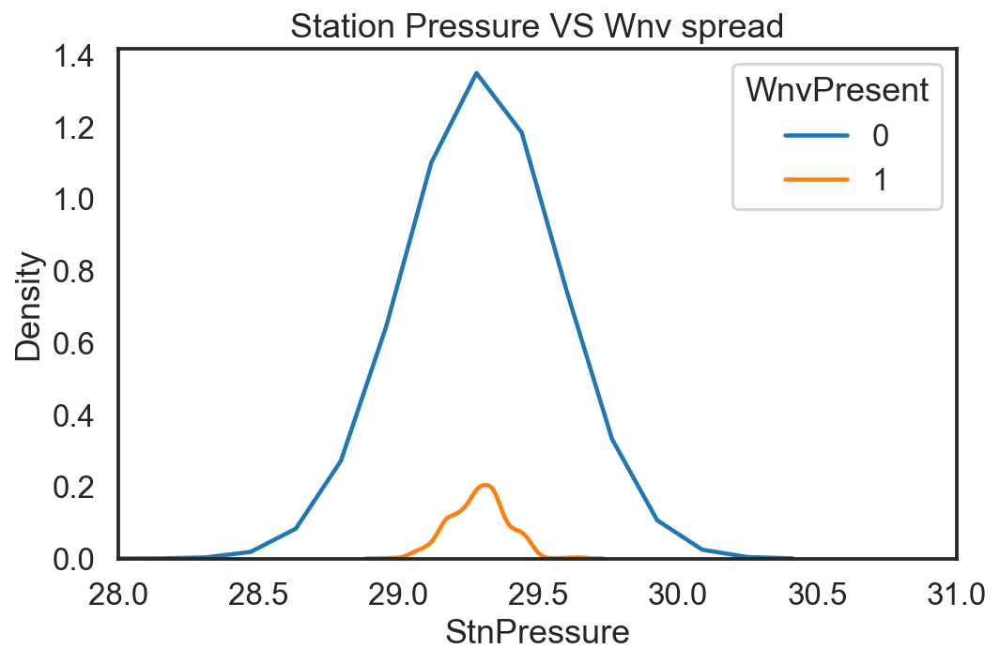

In [35]:
plt.figure(figsize=(8,5))
g = sns.kdeplot(data=df_merged, x='StnPressure',hue = 'WnvPresent')
g.set_title('Station Pressure VS Wnv spread')
g.set_xlim(28,31)

In [36]:
weather_code = set()
for row in df_merged['CodeSum'].str.split():
#     print(set(row))
    weather_code = weather_code.union(set(row))

weather_code    

{'BR', 'DZ', 'FG', 'HZ', 'RA', 'TS', 'TSRA', 'VCTS'}

In [37]:
#Split weather code
df_merged['CodeSum'] = df_merged['CodeSum'].str.split()

#Manuall One Hot Encoding
df_merged['metar_BR'] = df_merged['CodeSum'].map(lambda x: 1 if 'BR' in x else 0)
df_merged['metar_DZ'] = df_merged['CodeSum'].map(lambda x: 1 if 'DZ' in x else 0)
df_merged['metar_FG'] = df_merged['CodeSum'].map(lambda x: 1 if 'FG' in x else 0)
df_merged['metar_HZ'] = df_merged['CodeSum'].map(lambda x: 1 if 'HZ' in x else 0)
df_merged['metar_RA'] = df_merged['CodeSum'].map(lambda x: 1 if 'RA' in x else 0)
df_merged['metar_TS'] = df_merged['CodeSum'].map(lambda x: 1 if 'TS' in x else 0)
df_merged['metar_TSRA'] = df_merged['CodeSum'].map(lambda x: 1 if 'TSRA' in x else 0)

In [38]:
df_merged.columns[df_merged.columns.str.contains('metar')]

Index(['metar_BR', 'metar_DZ', 'metar_FG', 'metar_HZ', 'metar_RA', 'metar_TS',
       'metar_TSRA'],
      dtype='object')

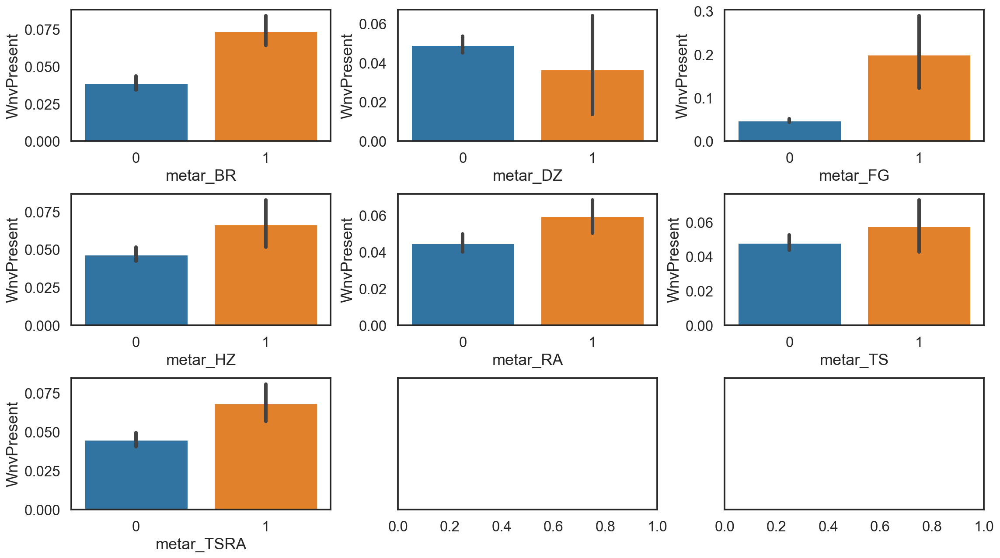

In [39]:
plt.subplots(3,3,figsize=(16,9),sharey=True)
for i,col in enumerate(df_merged.columns[df_merged.columns.str.contains('metar')],1):
    plt.subplot(3,3,i)
    g = sns.barplot(data=df_merged,x=col,y='WnvPresent')

plt.tight_layout()

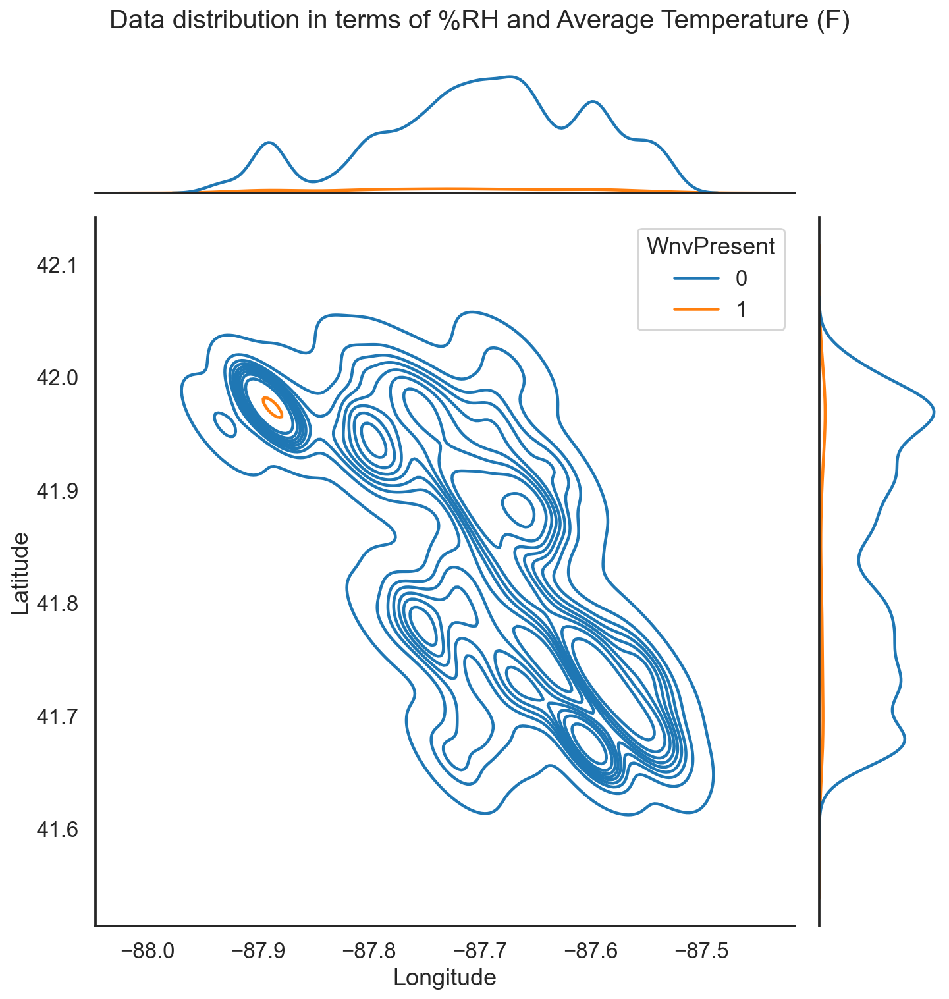

In [40]:
# Calculating Relative Humidity (%RH)

g = sns.jointplot(data=df_merged, y="Latitude", x="Longitude",
                  kind='kde', hue='WnvPresent', height=10)
g.fig.suptitle(
    'Data distribution in terms of %RH and Average Temperature (F)', y=1.05, fontsize=20);

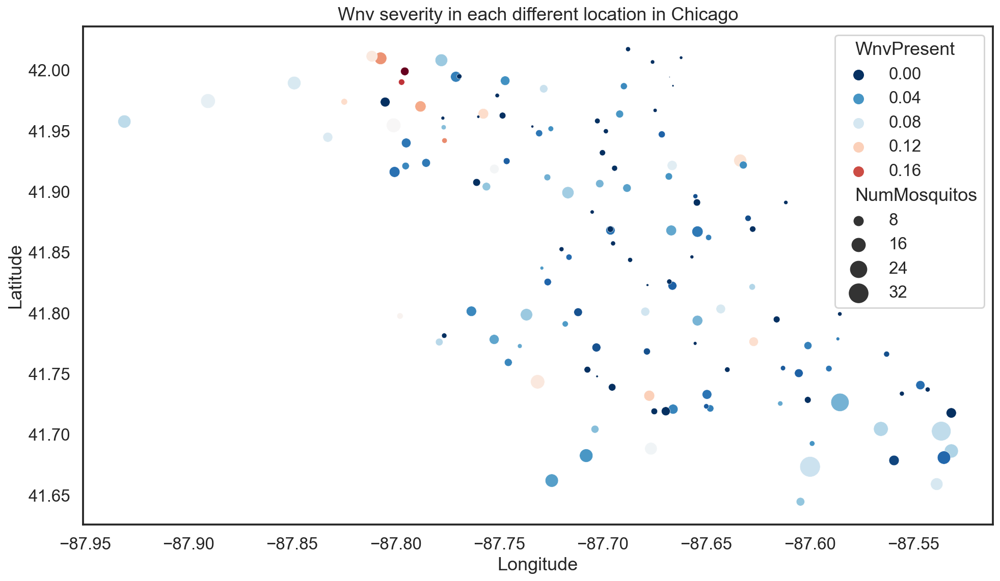

In [41]:
# Calculating Relative Humidity (%RH)
plt.figure(figsize=(16,9))
g = sns.scatterplot(data=df_merged.groupby('Trap').mean().sort_values(by='WnvPresent', ascending=False), y="Latitude", x="Longitude",
                    hue='WnvPresent', size = 'NumMosquitos' ,palette='RdBu_r', sizes = (1,400))

g.set_title('Wnv severity in each different location in Chicago');

In [42]:
df_merged['month'] = df_merged['Date'].dt.month

In [43]:
df_merged.groupby('month').mean()

,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent,Distance_from_s1_km,Distance_from_s2_km,Station,Tmax,Tmin,...,Year,Month,%RH,metar_BR,metar_DZ,metar_FG,metar_HZ,metar_RA,metar_TS,metar_TSRA
month,,,,,,,,,,,,,,,,,,,,,
5,41.843323,-87.688444,7.928571,2.738095,0.000000,33.254871,17.369210,1.797619,70.880952,57.488095,...,2008.404762,5.0,68.683862,0.297619,0.000000,0.000000,0.297619,0.000000,0.000000,0.000000
6,41.867737,-87.727113,8.138701,10.613667,0.000677,27.948323,17.561948,1.696888,78.506766,59.929635,...,2010.208390,6.0,63.670877,0.299729,0.000000,0.000000,0.119756,0.330176,0.144114,0.238160
7,41.847591,-87.707311,7.891727,13.843877,0.014193,30.949538,17.245813,1.758719,83.667883,66.014599,...,2009.871046,7.0,59.127467,0.292376,0.000406,0.000000,0.137064,0.285077,0.099351,0.186131
8,41.819744,-87.682165,7.622583,15.343233,0.094704,34.869230,17.179833,1.830765,84.332306,67.670496,...,2008.862146,8.0,65.024439,0.366209,0.026058,0.020454,0.093864,0.302606,0.109274,0.201737
9,41.840070,-87.698985,7.771996,9.362346,0.052980,32.136676,16.939126,1.799905,79.363292,60.981079,...,2009.511826,9.0,59.430516,0.128666,0.059130,0.008042,0.076159,0.182119,0.008042,0.042573
10,41.837669,-87.692552,7.884058,6.949275,0.007246,32.871830,15.863400,1.844203,76.677536,51.931159,...,2007.471014,10.0,65.931965,0.235507,0.000000,0.000000,0.105072,0.235507,0.000000,0.184783


## Data Cleaning Function

In [44]:
def cleaning(data, weather, how='train', distance = 'empirical'):
    """
    input following information:
    data = the training / testing dataframe
    weather = weather dataframe
    spray = spraying dataframe
    how = specify whether the function will be used for {'train','test'}
    distance = specify distance calculation function {'empirical','detail'}

    """
    #Convert date into datetime object
    data['Date'] = pd.to_datetime(data['Date'])
    weather['Date'] = pd.to_datetime(weather['Date'])
    
    data = data.drop(columns=['Address', 'Block',
                              'Street', 'AddressNumberAndStreet'])
    
    if distance == 'empirical':
        
        # Distance calculation 1° = 111 km  (or 60 nautical miles)
        lat_s1 = 41.995
        long_s1 = -87.933
        lat_s2 = 41.786
        long_s2 = -87.752
    
        data['Distance_from_s1_km'] = np.sqrt(np.power(60*(data['Latitude'] - lat_s1), 2) +
                                              np.power(60*(data['Longitude'] - long_s1), 2)) * 111/60  # *111/60 to convert from NM to km
    
        data['Distance_from_s2_km'] = np.sqrt(np.power(60*(data['Latitude'] - lat_s2), 2) +
                                              np.power(60*(data['Longitude'] - long_s2), 2)) * 111/60  # *111/60 to convert from NM to km
    
        # Select dominant weather station
        data['Station'] = data.apply(lambda row: 2 if (
            row['Distance_from_s1_km'] > row['Distance_from_s2_km']) else 1, axis=1)
        
        print(data['Station'].value_counts())
    
    elif distance == 'detail':
        from math import radians, sin, cos, atan2, sqrt
        stn1_location = (41.995,-87.933)
        stn2_location = (41.786,-87.752)

        def calc_dist_chk(lat1, lon1, lat2, lon2):
            R = 6373.0     # approximate radius of earth in km
            lat1 = radians(lat1)
            lon1 = radians(lon1)
            lat2 = radians(lat2)
            lon2 = radians(lon2)
            dlon = lon2 - lon1
            dlat = lat2 - lat1
            #formula calc distance between two points 
            #haversine formula
            a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
            c = 2 * atan2(sqrt(a), sqrt(1 - a))
            #distance in km
            distance = R * c
            return round(distance, 4)
        
        def find_nearest_stn(latitude, longitude):
            dist_from_stn1 = calc_dist_chk(latitude, longitude, stn1_location[0], stn1_location[1])
            dist_from_stn2 = calc_dist_chk(latitude, longitude, stn2_location[0], stn2_location[1])
            if dist_from_stn1 <= dist_from_stn2:
                return 1
            else:
                return 2
        
        data['Station'] = 0
        for index, row in data.iterrows():
            nearest_station = find_nearest_stn(row['Latitude'],row['Longitude'])
            data.loc[index,'Station'] = nearest_station
        
        print(data['Station'].value_counts())
        
    #Merge data and weather dataframe together
    df_merged = pd.merge(data, weather, left_on=['Date','Station'],right_on=['Date','Station'])
    
    
#   "-----------------------------------------------------------------------------------------------------"
    #Type Conversion
    df_merged['Tavg'] = df_merged['Tavg'].map(lambda s: -1 if s.strip().isalpha() else int(s))
    df_merged['PrecipTotal'] = df_merged['PrecipTotal'].map(lambda s: -1 if s.strip().isalpha() else float(s))
    df_merged['WetBulb'] = df_merged['WetBulb'].map(lambda s: -1 if s.strip().isalpha() else float(s))
    df_merged['Heat'] = df_merged['Heat'].map(lambda s: -1 if s.strip().isalpha() else float(s))
    df_merged['Cool'] = df_merged['Cool'].map(lambda s: -1 if s.strip().isalpha() else float(s))
    
    #Feature Engineering
    df_merged['Month'] = df_merged['Date'].dt.month
    df_merged['Year'] = df_merged['Date'].dt.year
    df_merged['%RH'] = 100 - (25/9)*(df_merged['Tavg'] - df_merged['DewPoint'])
    
    #Split weather code
    df_merged['CodeSum'] = df_merged['CodeSum'].str.split()
    
    #Manual One Hot Encoding
    df_merged['metar_BR'] = df_merged['CodeSum'].map(lambda x: 1 if 'BR' in x else 0)
    df_merged['metar_DZ'] = df_merged['CodeSum'].map(lambda x: 1 if 'DZ' in x else 0)
    df_merged['metar_FG'] = df_merged['CodeSum'].map(lambda x: 1 if 'FG' in x else 0)
    df_merged['metar_HZ'] = df_merged['CodeSum'].map(lambda x: 1 if 'HZ' in x else 0)
    df_merged['metar_RA'] = df_merged['CodeSum'].map(lambda x: 1 if 'RA' in x else 0)
    df_merged['metar_TS'] = df_merged['CodeSum'].map(lambda x: 1 if 'TS' in x else 0)
    df_merged['metar_TSRA'] = df_merged['CodeSum'].map(lambda x: 1 if 'TSRA' in x else 0)
    
    #Type conversion
#     df_merged['Tavg'] = df_merged['Tavg'].astype(int)
#     df_merged['PrecipTotal'] = df_merged['PrecipTotal'].map(lambda s: -1 if s.strip().isalpha() else float(s))
  
    #Subset features
    
#     all_col = [
#        'Date', 'Species', 'Trap', 'Latitude', 'Longitude', 'AddressAccuracy',
#        'NumMosquitos', 'WnvPresent', 'Distance_from_s1_km',
#        'Distance_from_s2_km', 'Station', 'Tmax', 'Tmin', 'Tavg', 'Depart',
#        'DewPoint', 'WetBulb', 'Heat', 'Cool', 'Sunrise', 'Sunset', 'CodeSum',
#        'Depth', 'Water1', 'SnowFall', 'PrecipTotal', 'StnPressure', 'SeaLevel',
#        'ResultSpeed', 'ResultDir', 'AvgSpeed', 'Year', 'Month', '%RH',
#        'metar_BR', 'metar_DZ', 'metar_FG', 'metar_HZ', 'metar_RA', 'metar_TS',
#        'metar_TSRA', 'month'
        
#     ]
    
    use_col = [
       'WnvPresent','Month','Species', 'Latitude', 'Longitude','Tavg',
       'DewPoint', 'WetBulb', 'Heat', 'Cool','%RH',
       'ResultSpeed', 'ResultDir',
       'metar_BR', 'metar_DZ', 'metar_FG', 'metar_HZ', 'metar_RA', 'metar_TS','metar_TSRA',
    ]
    
    # Remove datapoint affected by spraying
    if how == 'train':
        df_merged = df_merged[~((df_merged['Date'].dt.year == 2011) & 
                        (df_merged['Trap'].isin(['T006', 'T014', 'T015', 'T223'])))]
        
        df_merged = df_merged[~((df_merged['Date'].dt.year == 2013) & 
                        (df_merged['Trap'].isin(
                                                """T016
                                                T223
                                                T143
                                                T008
                                                T028
                                                T231
                                                T001
                                                T218
                                                T228
                                                T147
                                                T050
                                                T017
                                                T142
                                                T144
                                                T013
                                                T037
                                                T151
                                                T153
                                                T230
                                                T044
                                                T066
                                                T156
                                                T159
                                                T089
                                                T085
                                                T080
                                                T162
                                                T227""".split())))]
        return df_merged[use_col]
    
    # if data is the test set, return without chopping out effect of spray 
    elif how == 'test':
        return df_merged[use_col[1:]]
    

# Preprocessing

In [45]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')
weather = pd.read_csv('data/weather.csv')

In [46]:
#Data Cleaning
df_train = cleaning(train, weather, how='train', distance = 'empirical')
df_test = cleaning(test, weather, how='test', distance = 'empirical')

X = df_train.drop(columns='WnvPresent')
y = df_train['WnvPresent']

2    8245
1    2261
Name: Station, dtype: int64
2    97015
1    19278
Name: Station, dtype: int64


## Train-test split

In [47]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42,stratify=y)

In [48]:
y_train.value_counts(normalize=True)

0    0.951183
1    0.048817
Name: WnvPresent, dtype: float64

In [49]:
y_val.value_counts(normalize=True)

0    0.950951
1    0.049049
Name: WnvPresent, dtype: float64

## Standardize and One-hot Encoding

### Training set

In [50]:
# OneHotEncoding Species Attribute
enc = OneHotEncoder(handle_unknown='ignore', sparse=False)

enc.fit(X_train[['Species']])
X_train_enc = pd.DataFrame(enc.transform(X_train[['Species']]), 
                      columns = enc.get_feature_names(X_train[['Species']].columns))
#Standardize
ss = StandardScaler()
ss.fit(X_train.drop(columns='Species'))
X_train_sc = ss.transform(X_train.drop(columns='Species'))
X_train_sc = pd.DataFrame(X_train_sc, columns = X_train.drop(columns='Species').columns)


#Concatanate numerical and categorical columns
X_train_prep = pd.concat([X_train_sc,X_train_enc],axis = 1)

### Validation set

In [51]:
# OneHotEncoding Species Attribute

X_val_enc = pd.DataFrame(enc.transform(X_val[['Species']]), 
                      columns = enc.get_feature_names(X_val[['Species']].columns))
#Standardize
X_val_sc = ss.transform(X_val.drop(columns='Species'))
X_val_sc = pd.DataFrame(X_val_sc, columns = X_val.drop(columns='Species').columns)


#Concatanate numerical and categorical columns
X_val_prep = pd.concat([X_val_sc,X_val_enc],axis = 1)

### Testing set

In [52]:
# OneHotEncoding Species Attribute
X_test = df_test

X_test_enc = pd.DataFrame(enc.transform(X_test[['Species']]), 
                      columns = enc.get_feature_names(X_test[['Species']].columns))
#Standardize
X_test_sc = ss.transform(X_test.drop(columns='Species'))
X_test_sc = pd.DataFrame(X_test_sc, columns = X_test.drop(columns='Species').columns)


#Concatanate numerical and categorical columns
X_test_prep = pd.concat([X_test_sc,X_test_enc],axis = 1)

## SMOTE to handling imbalance class problem

In [53]:
sm = SMOTE()
Xsm_train, ysm_train = sm.fit_resample(X_train_prep,y_train)

Right now, we'll have 3 different dataset for different purpose ...

1. SMOTE-Oversampling training set **(Xsm_train, ysm_train)** for model training
1. Validation set **(X_val_prep, y_val)** for model tuning
1. Testing set **(X_test_prep, y_test)** for submission

# Models

## SVM

In [54]:
svc = SVC(C=200,kernel = 'poly',degree = 4, random_state=42)
svc.fit(X_train_prep, y_train)

SVC(C=200, degree=4, kernel='poly', random_state=42)

In [55]:
pred_svc = svc.predict(X_val_prep)
pred_svc[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [56]:
svc.score(X_train_prep, y_train)

0.9570659657028414

In [57]:
svc.score(X_val_prep, y_val)

0.9464464464464465

In [58]:
accuracy_score(pred_svc, y_val)

0.9464464464464465

In [59]:
print(f'AUC score = {roc_auc_score(y_val, pred_svc)}')
print(f'f1 score = {f1_score(y_val, pred_svc)}')
print(f'Precision score = {precision_score(y_val, pred_svc)}')
print(f'Recall score = {recall_score(y_val, pred_svc)}')

AUC score = 0.5266648764769065
f1 score = 0.10084033613445377
Precision score = 0.2857142857142857
Recall score = 0.061224489795918366


## SVM (SMOTE)

In [60]:
svc2 = SVC(C=200,kernel = 'poly',degree = 4, random_state=42)
svc2.fit(Xsm_train, ysm_train)

SVC(C=200, degree=4, kernel='poly', random_state=42)

In [61]:
pred_svc2 = svc2.predict(X_val_prep)
pred_svc2[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [62]:
svc2.score(Xsm_train, ysm_train)

0.9186735096723253

In [63]:
svc2.score(X_val_prep, y_val)

0.8398398398398398

In [64]:
print(f'AUC score = {roc_auc_score(y_val, pred_svc2)}')
print(f'f1 score = {f1_score(y_val, pred_svc2)}')
print(f'Precision score = {precision_score(y_val, pred_svc2)}')
print(f'Recall score = {recall_score(y_val, pred_svc2)}')

AUC score = 0.7077175080558539
f1 score = 0.2558139534883721
Precision score = 0.16566265060240964
Recall score = 0.5612244897959183


## SVM (SMOTE) >> Test

In [65]:
pred_svc2 = svc2.predict(X_test_prep)
pred_svc2[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [66]:
pred_svc2 = pd.DataFrame(pred_svc2).reset_index().rename(columns={'index':'Id',0:'WnvPresent'})
pred_svc2['Id'] = [i for i in range(1,len(pred_svc2)+1)]

In [67]:
pred_svc2

,Id,WnvPresent
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0
...,...,...
116288,116289,0
116289,116290,0
116290,116291,0
116291,116292,0


In [68]:
pred_svc2.to_csv('pred_svc2.csv',index=False)

## Logistic Regression

In [69]:
lgr = LogisticRegression(C=200, random_state=42)
lgr.fit(X_train_prep, y_train)

C:\Users\User\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


LogisticRegression(C=200, random_state=42)

In [70]:
pred_lgr = lgr.predict(X_val_prep)
pred_lgr[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [71]:
lgr.score(X_train_prep, y_train)

0.9508073601201652

In [72]:
lgr.score(X_val_prep, y_val)

0.94994994994995

In [73]:
accuracy_score(pred_lgr, y_val)

0.94994994994995

In [74]:
print(f'AUC score = {roc_auc_score(y_val, pred_lgr)}')
print(f'f1 score = {f1_score(y_val, pred_lgr)}')
print(f'Precision score = {precision_score(y_val, pred_lgr)}')
print(f'Recall score = {recall_score(y_val, pred_lgr)}')

AUC score = 0.4994736842105263
f1 score = 0.0
Precision score = 0.0
Recall score = 0.0


## Logistic Regression (SMOTE)

In [75]:
lgr2 = LogisticRegression(C=200,random_state=42)
lgr2.fit(Xsm_train, ysm_train)

LogisticRegression(C=200, random_state=42)

In [76]:
pred_lgr2 = lgr2.predict(X_val_prep)
pred_lgr2[:50]

array([0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1,
       0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 1], dtype=int64)

In [77]:
lgr2.score(Xsm_train, ysm_train)

0.6986445584945388

In [78]:
lgr2.score(X_val_prep, y_val)

0.6661661661661662

In [79]:
accuracy_score(pred_lgr2, y_val)

0.6661661661661662

In [80]:
print(f'AUC score = {roc_auc_score(y_val, pred_lgr2)}')
print(f'f1 score = {f1_score(y_val, pred_lgr2)}')
print(f'Precision score = {precision_score(y_val, pred_lgr2)}')
print(f'Recall score = {recall_score(y_val, pred_lgr2)}')

AUC score = 0.6938238453276048
f1 score = 0.17552533992583436
Precision score = 0.09985935302390998
Recall score = 0.7244897959183674


## Decision Tree (SMOTE)

In [81]:
tree2 = DecisionTreeClassifier(criterion="gini", max_depth=None,random_state=42)
tree2.fit(Xsm_train, ysm_train)

DecisionTreeClassifier(random_state=42)

In [82]:
pred_tree2 = tree2.predict(X_val_prep)
pred_tree2[:50]

array([0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [83]:
tree2.score(Xsm_train, ysm_train)

0.9826292933280695

In [84]:
tree2.score(X_val_prep, y_val)

0.8963963963963963

In [85]:
print(f'AUC score = {roc_auc_score(y_val, pred_tree2)}')
print(f'f1 score = {f1_score(y_val, pred_tree2)}')
print(f'Precision score = {precision_score(y_val, pred_tree2)}')
print(f'Recall score = {recall_score(y_val, pred_tree2)}')

AUC score = 0.6455155746509129
f1 score = 0.25806451612903225
Precision score = 0.19889502762430938
Recall score = 0.3673469387755102


## Random Forest (SMOTE)

In [86]:
clf2 = RandomForestClassifier(n_estimators=200,min_samples_split=11,min_samples_leaf=7, max_features=2,max_depth= 80,random_state=42)
clf2.fit(Xsm_train, ysm_train)

RandomForestClassifier(max_depth=80, max_features=2, min_samples_leaf=7,
                       min_samples_split=11, n_estimators=200, random_state=42)

In [87]:
pred_clf2 = clf2.predict(X_val_prep)
pred_clf2[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [88]:
clf2.score(Xsm_train, ysm_train)

0.925911304118963

In [89]:
clf2.score(X_val_prep, y_val)

0.8738738738738738

In [90]:
print(f'AUC score = {roc_auc_score(y_val, pred_clf2)}')
print(f'f1 score = {f1_score(y_val, pred_clf2)}')
print(f'Precision score = {precision_score(y_val, pred_clf2)}')
print(f'Recall score = {recall_score(y_val, pred_clf2)}')

AUC score = 0.7159344790547797
f1 score = 0.29608938547486036
Precision score = 0.20384615384615384
Recall score = 0.5408163265306123


## Random Forest (SMOTE) >> Test

In [91]:
pred_clf2 = clf2.predict(X_test_prep)
pred_clf2[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [92]:
pred_clf2 = pd.DataFrame(pred_clf2).reset_index().rename(columns={'index':'Id',0:'WnvPresent'})
pred_clf2['Id'] = [i for i in range(1,len(pred_clf2)+1)]

In [93]:
pred_clf2.to_csv('pred_clf2.csv',index=False)

## Random Forest (SMOTE) GS

In [131]:
clf2_params = {
    'max_depth': [None, 1, 2, 3, 4, 5],
    'min_samples_leaf': [3, 4, 5],
    'min_samples_split': [8, 10, 12],
    'n_estimators': [100, 150, 200]}
clf2_gs = GridSearchCV(clf2, param_grid=clf2_params, cv=5)
clf2_gs.fit(Xsm_train, ysm_train)
clf2_gs.best_params_
#0.52 on kaggle

{'max_depth': None,
 'min_samples_leaf': 3,
 'min_samples_split': 8,
 'n_estimators': 100}

In [125]:
clf2_gs.score(Xsm_train, ysm_train)

0.9262402947756284

In [126]:
clf2_gs.score(X_val_prep, y_val)

0.8723723723723724

In [127]:
pred_clf2_gs = clf2_gs.predict(X_test_prep)
pred_clf2_gs[:50]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [128]:
pred_clf2_gs_df = pd.DataFrame(pred_clf2_gs).reset_index().rename(columns={'index':'Id',0:'WnvPresent'})
pred_clf2_gs_df['Id'] = [i for i in range(1,len(pred_clf2_gs_df)+1)]

In [129]:
pred_clf2_gs_df.head()

,Id,WnvPresent
0,1,0
1,2,0
2,3,0
3,4,0
4,5,0


In [130]:
pred_clf2_gs_df.to_csv('pred_clf2_gs_df.csv',index=False)

## XGBoost (SMOTE)

In [101]:
xgb2 =XGBClassifier(n_estimators=300, learning_rate=0.09, max_depth=6)
xgb2.fit(Xsm_train, ysm_train)

XGBClassifier(learning_rate=0.09, max_depth=6, n_estimators=300)

In [102]:
pred_xgb2 = xgb2.predict(X_val_prep)
pred_xgb2[:50]

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [103]:
xgb2.score(Xsm_train, ysm_train)

0.9661797604948019

In [104]:
xgb2.score(X_val_prep, y_val)

0.9064064064064065

In [105]:
print(f'AUC score = {roc_auc_score(y_val, pred_xgb2)}')
print(f'f1 score = {f1_score(y_val, pred_xgb2)}')
print(f'Precision score = {precision_score(y_val, pred_xgb2)}')
print(f'Recall score = {recall_score(y_val, pred_xgb2)}')

AUC score = 0.6459398496240603
f1 score = 0.27237354085603116
Precision score = 0.22012578616352202
Recall score = 0.35714285714285715
